# Underwater Object Detection with YOLOv8 — Aquarium Dataset

Training a YOLOv8n detector on the Aquarium dataset to find 7 classes of marine animals: fish, jellyfish, penguin, puffin, shark, starfish and stingray.

**Before running on Kaggle**
- Settings → Accelerator → **GPU T4 x2** (or P100)
- Settings → **Internet on**
- Add Input → search **`slavkoprytula/aquarium-data-cots`** and add it (if you skip this, the notebook downloads it with `kagglehub`)

## Environment Setup
Installing Ultralytics and checking the GPU.

In [1]:
!pip install -q -U ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 26.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 5.9 MB/s eta 0:00:00


In [2]:
import os
import glob
import random
import shutil
import numpy as np
import pandas as pd
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from ultralytics import YOLO
from IPython.display import FileLink

%matplotlib inline

device = 0 if torch.cuda.is_available() else 'cpu'
print('Torch:', torch.__version__)
print('Device:', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU')

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Torch: 2.10.0+cu128
Device: Tesla T4


## Loading the Dataset
Finding the dataset inside `/kaggle/input` (or downloading it with `kagglehub` if it wasn't added), then copying it to a writable folder so YOLO can create its label cache files.

In [3]:
def find_dataset_root():
    hits = glob.glob('/kaggle/input/**/aquarium_pretrain', recursive=True)
    if hits:
        return hits[0]
    import kagglehub
    path = kagglehub.dataset_download('slavkoprytula/aquarium-data-cots')
    hits = glob.glob(os.path.join(path, '**/aquarium_pretrain'), recursive=True)
    return hits[0] if hits else path

src_dir = find_dataset_root()
base_dir = '/tmp/aquarium_pretrain'
if not os.path.exists(base_dir):
    shutil.copytree(src_dir, base_dir)

print('Source :', src_dir)
print('Working:', base_dir)
for split in ['train', 'valid', 'test']:
    n = len(os.listdir(os.path.join(base_dir, split, 'images')))
    print(f'{split:6s}: {n} images')

Source : /kaggle/input/datasets/slavkoprytula/aquarium-data-cots/aquarium_pretrain
Working: /tmp/aquarium_pretrain
train : 448 images
valid : 127 images
test  : 63 images


## Paths, Classes and Output Folders

In [4]:
train_images = os.path.join(base_dir, 'train/images')
train_labels = os.path.join(base_dir, 'train/labels')
val_images   = os.path.join(base_dir, 'valid/images')
val_labels   = os.path.join(base_dir, 'valid/labels')
test_images  = os.path.join(base_dir, 'test/images')
test_labels  = os.path.join(base_dir, 'test/labels')

classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
Idx2Label = {idx: label for idx, label in enumerate(classes)}
Label2Index = {label: idx for idx, label in enumerate(classes)}
print('Index to Label Mapping:', Idx2Label)
print('Label to Index Mapping:', Label2Index)

work_dir      = '/kaggle/working'
project_dir   = os.path.join(work_dir, 'runs')
run_name      = 'yolov8n_custom'
run_dir       = os.path.join(project_dir, run_name)
export_dir    = os.path.join(work_dir, 'CV_Portfolio_YOLO')
plots_dst     = os.path.join(export_dir, 'training_plots')
inference_dst = os.path.join(export_dir, 'inference_samples')
for d in [export_dir, plots_dst, inference_dst]:
    os.makedirs(d, exist_ok=True)

Index to Label Mapping: {0: 'fish', 1: 'jellyfish', 2: 'penguin', 3: 'puffin', 4: 'shark', 5: 'starfish', 6: 'stingray'}
Label to Index Mapping: {'fish': 0, 'jellyfish': 1, 'penguin': 2, 'puffin': 3, 'shark': 4, 'starfish': 5, 'stingray': 6}


## Data Exploration — Class Distribution
Counting annotated objects per class in each split.

,train,valid,test
fish,1961,459,249
jellyfish,385,155,154
penguin,330,104,82
puffin,175,74,35
shark,259,57,38
starfish,78,27,11
stingray,136,33,15


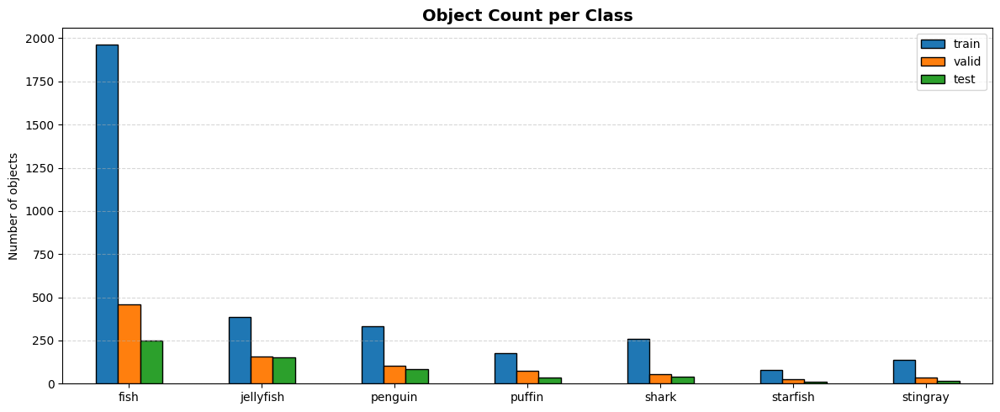

In [5]:
def count_labels(label_dir):
    counts = np.zeros(len(classes), dtype=int)
    for f in os.listdir(label_dir):
        with open(os.path.join(label_dir, f)) as fh:
            for line in fh:
                if line.strip():
                    counts[int(float(line.split()[0]))] += 1
    return counts

dist = pd.DataFrame({
    'train': count_labels(train_labels),
    'valid': count_labels(val_labels),
    'test' : count_labels(test_labels),
}, index=classes)
display(dist)

dist.plot(kind='bar', figsize=(12, 5), edgecolor='black')
plt.title('Object Count per Class', fontsize=14, fontweight='bold')
plt.ylabel('Number of objects')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()

## Data Exploration — Ground Truth Bounding Boxes
Plotting 12 random training images with their annotated boxes.

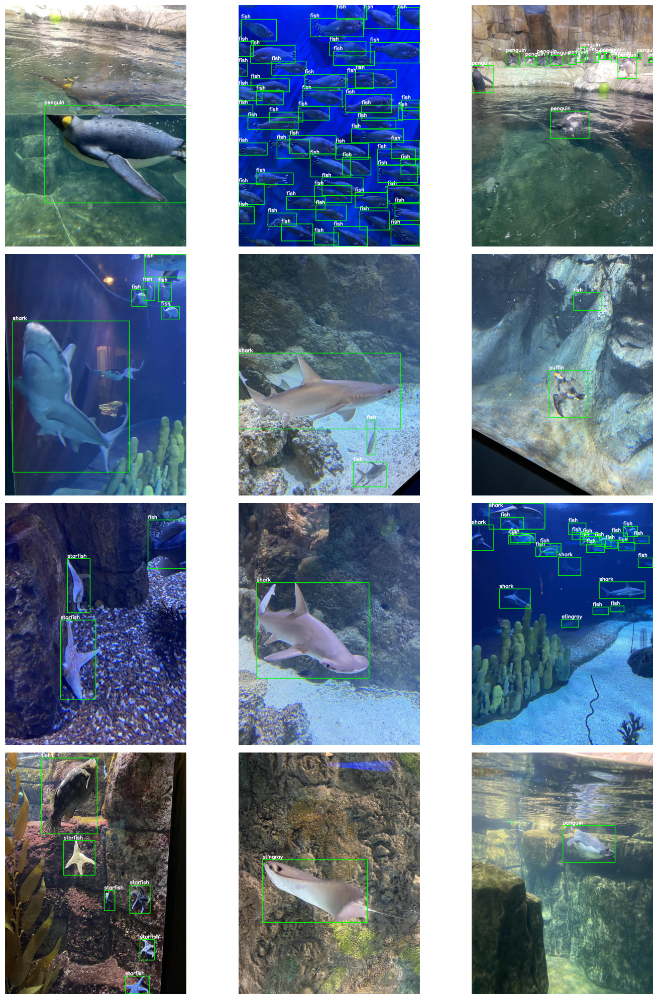

In [6]:
def visualize_image_with_annotation_bboxes(image_dir, label_dir, n=12):
    image_files = sorted(os.listdir(image_dir))
    sample_image_files = random.sample(image_files, n)
    fig, axs = plt.subplots(4, 3, figsize=(15, 20))

    for i, image_file in enumerate(sample_image_files):
        ax = axs[i // 3, i % 3]
        image = cv2.cvtColor(cv2.imread(os.path.join(image_dir, image_file)), cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape
        label_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.txt')

        if os.path.exists(label_path):
            with open(label_path) as f:
                for label in f:
                    if not label.strip():
                        continue
                    class_id, xc, yc, bw, bh = map(float, label.split())
                    x_min, y_min = int((xc - bw / 2) * w), int((yc - bh / 2) * h)
                    x_max, y_max = int((xc + bw / 2) * w), int((yc + bh / 2) * h)
                    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
                    cv2.putText(image, Idx2Label[int(class_id)], (x_min, max(y_min - 5, 15)),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

        ax.imshow(image)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(plots_dst, 'ground_truth_samples.png'), dpi=120, bbox_inches='tight')
    plt.show()

visualize_image_with_annotation_bboxes(train_images, train_labels)

## Creating the YOLO Dataset Config
Writing `data.yml` with absolute paths so it works from any directory.

In [7]:
yaml_path = os.path.join(work_dir, 'data.yml')
yaml_text = f"""path: {base_dir}
train: train/images
val: valid/images
test: test/images

nc: {len(classes)}
names: {classes}
"""
with open(yaml_path, 'w') as f:
    f.write(yaml_text)
print(yaml_text)

path: /tmp/aquarium_pretrain
train: train/images
val: valid/images
test: test/images

nc: 7
names: ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']



## Model Training
Fine-tuning a COCO-pretrained YOLOv8 nano model for 100 epochs with AdamW.

In [8]:
torch.cuda.empty_cache()
model = YOLO('yolov8n.pt')

results = model.train(
    data=yaml_path,
    epochs=100,
    imgsz=640,
    batch=16,
    workers=4,
    device=device,
    save_period=10,
    optimizer='AdamW',
    lr0=5e-4,
    weight_decay=0.01,
    augment=True,
    project=project_dir,
    name=run_name,
    exist_ok=True,
)

Ultralytics 8.4.155 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_custom, nbs=64, nms=None, opset=None, opti

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


      2/100      2.55G      1.609      2.703      1.269        316        640: 100% ━━━━━━━━━━━━ 28/28 8.5it/s 3.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s0.3s
                   all        127        909      0.109      0.345      0.115      0.061

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/100      2.56G      1.595       2.41      1.265        227        640: 100% ━━━━━━━━━━━━ 28/28 8.7it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.1it/s 1.0s0.4s
                   all        127        909      0.441      0.202      0.269      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      4/100      2.56G      1.578       2.24      1.232        160        640: 100% ━━━━━━━━━━━━ 28/28 8.4it/s 3.3s0.3s
                 Class     Images  Instances 

## Training Performance
Loss curves and validation metrics across epochs, read from `results.csv`.

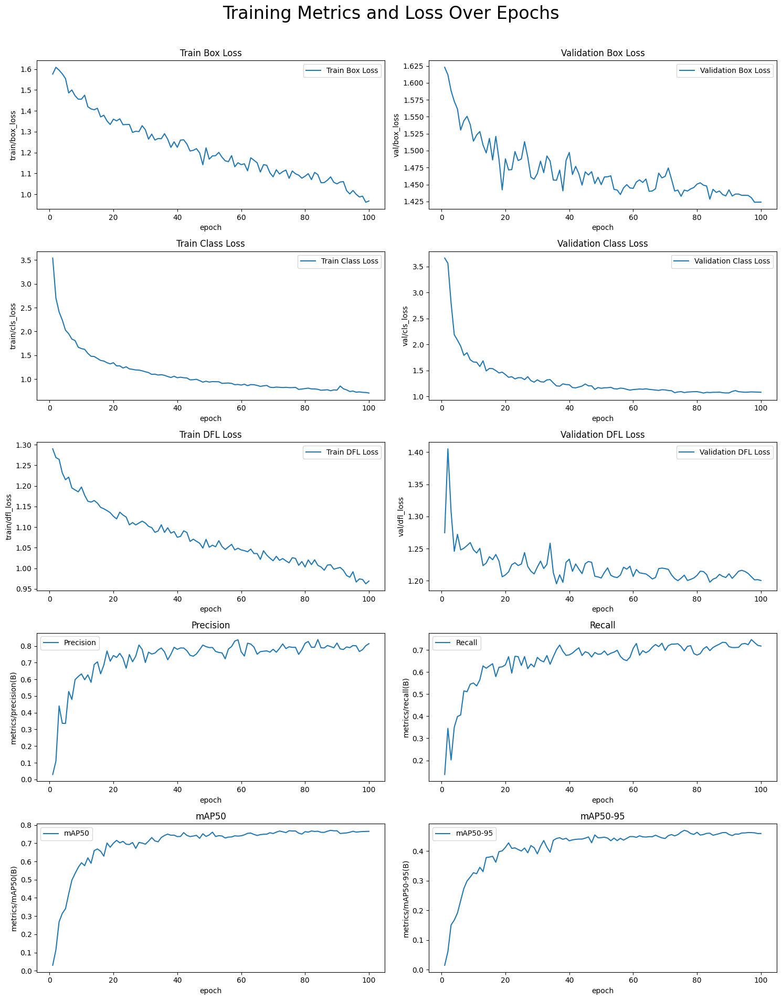

In [9]:
df = pd.read_csv(os.path.join(run_dir, 'results.csv'))
df.columns = df.columns.str.strip()

plot_cols = [
    ('train/box_loss', 'Train Box Loss'),          ('val/box_loss', 'Validation Box Loss'),
    ('train/cls_loss', 'Train Class Loss'),        ('val/cls_loss', 'Validation Class Loss'),
    ('train/dfl_loss', 'Train DFL Loss'),          ('val/dfl_loss', 'Validation DFL Loss'),
    ('metrics/precision(B)', 'Precision'),         ('metrics/recall(B)', 'Recall'),
    ('metrics/mAP50(B)', 'mAP50'),                 ('metrics/mAP50-95(B)', 'mAP50-95'),
]

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
for ax, (col, title) in zip(axs.flatten(), plot_cols):
    sns.lineplot(x='epoch', y=col, data=df, ax=ax, label=title)
    ax.set_title(title)

plt.suptitle('Training Metrics and Loss Over Epochs', fontsize=24)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig(os.path.join(plots_dst, 'custom_training_metrics.png'), dpi=150, bbox_inches='tight')
plt.show()

## YOLO Generated Plots
Confusion matrix and PR curve saved by Ultralytics during training.

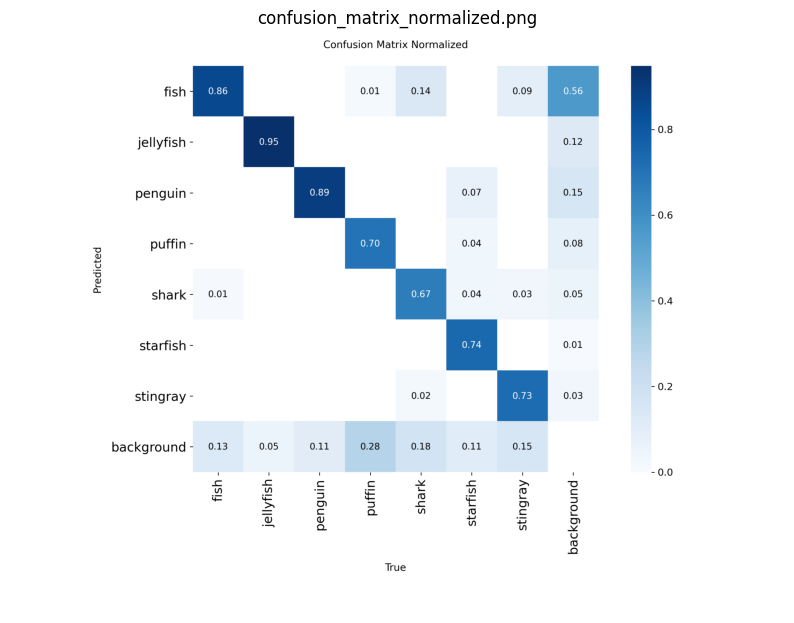

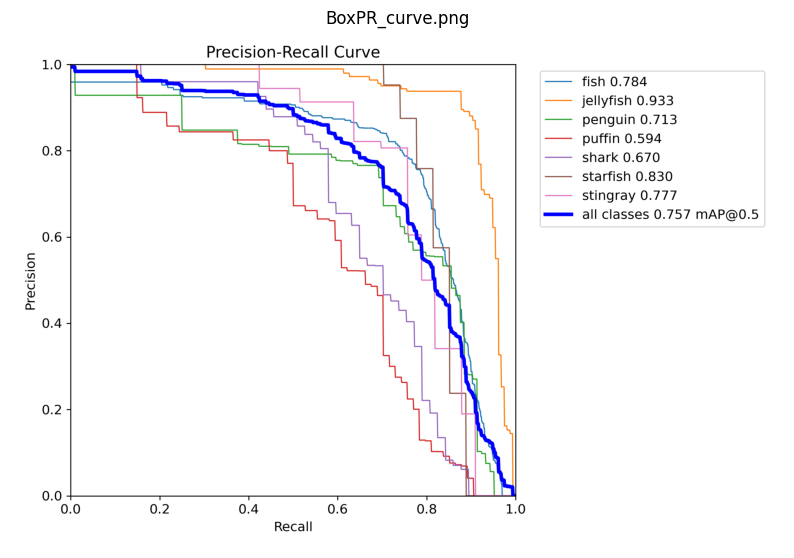

In [10]:
for fname in ['confusion_matrix_normalized.png', 'BoxPR_curve.png', 'PR_curve.png']:
    p = os.path.join(run_dir, fname)
    if os.path.exists(p):
        plt.figure(figsize=(10, 8))
        plt.imshow(plt.imread(p))
        plt.axis('off')
        plt.title(fname)
        plt.show()

## Evaluation on the Test Set
Loading the best checkpoint and computing mAP on the held-out test split.

In [11]:
best_weights = os.path.join(run_dir, 'weights', 'best.pt')
model = YOLO(best_weights)

metrics = model.val(data=yaml_path, split='test', conf=0.5, device=device,
                    project=project_dir, name='test_eval', exist_ok=True)

print(f"Mean Average Precision @.5:.95 (mAP50-95): {metrics.box.map:.4f}")
print(f"Mean Average Precision @.50 (mAP50)      : {metrics.box.map50:.4f}")
print(f"Mean Average Precision @.75 (mAP75)      : {metrics.box.map75:.4f}")

Ultralytics 8.4.155 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
Model summary (fused): 72 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2328.5±1061.6 MB/s, size: 102.1 KB)
val: Scanning /tmp/aquarium_pretrain/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 1.2Kit/s 0.1s
val: New cache created: /tmp/aquarium_pretrain/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.9it/s 2.1s0.8s
                   all         63        584      0.863      0.642      0.619      0.404
                  fish         30        249      0.804      0.643      0.594      0.352
             jellyfish         11        154      0.866      0.799      0.779      0.516
               penguin          7         82      0.857      0.512      0.488      0.219
                puffin          6         35      0.737        0.4      0

## Inference on Test Images
Running the trained model on 12 random test images.

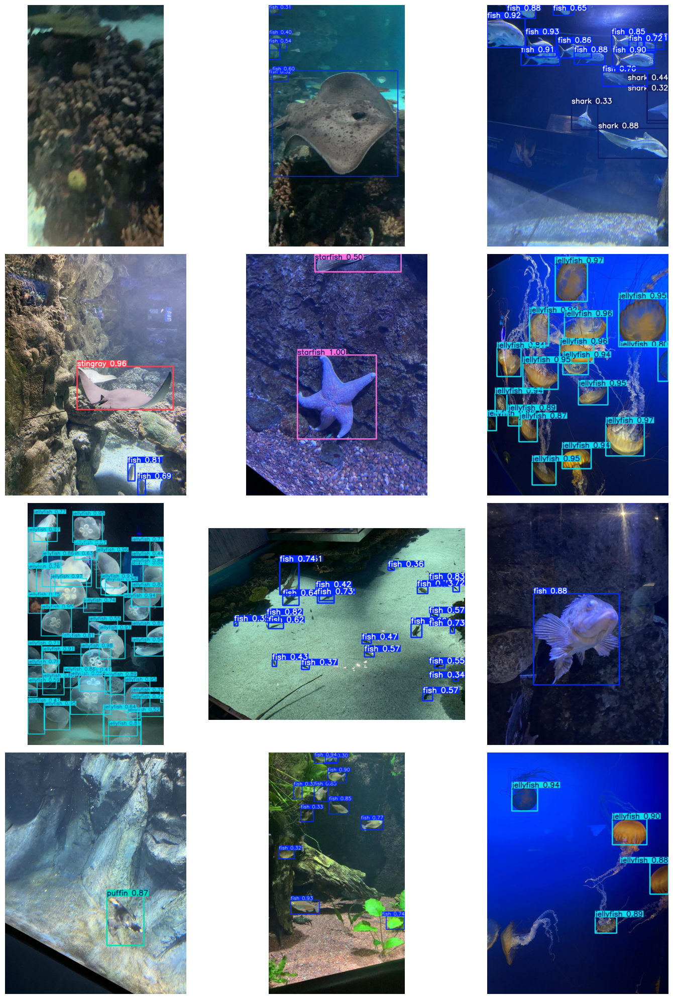

In [12]:
def predict_detection(image_path):
    detect_result = model(cv2.imread(image_path), verbose=False)
    return cv2.cvtColor(detect_result[0].plot(), cv2.COLOR_BGR2RGB)

sample_image_files = random.sample(sorted(os.listdir(test_images)), 12)
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
for i, image_file in enumerate(sample_image_files):
    detect_image = predict_detection(os.path.join(test_images, image_file))
    axs[i // 3, i % 3].imshow(detect_image)
    axs[i // 3, i % 3].axis('off')
    cv2.imwrite(os.path.join(inference_dst, f'pred_{image_file}'),
                cv2.cvtColor(detect_image, cv2.COLOR_RGB2BGR))

plt.tight_layout()
plt.show()

## Evaluation Metrics Visualization
Per-class AP, precision, recall and F1 on the test set. Classes are taken from `ap_class_index`, so the bars stay aligned even if a class is missing from the test split.

In [13]:
class_names         = [classes[i] for i in metrics.box.ap_class_index]
per_class_map50     = list(metrics.box.ap50)
per_class_map50_95  = list(metrics.box.ap)
per_class_precision = list(metrics.box.p)
per_class_recall    = list(metrics.box.r)
per_class_f1        = [2 * p * r / (p + r + 1e-8) for p, r in zip(per_class_precision, per_class_recall)]

overall_map50    = metrics.box.map50
overall_map50_95 = metrics.box.map
overall_map75    = metrics.box.map75
x = np.arange(len(class_names))

### Per-Class mAP@0.50 vs mAP@0.50:0.95

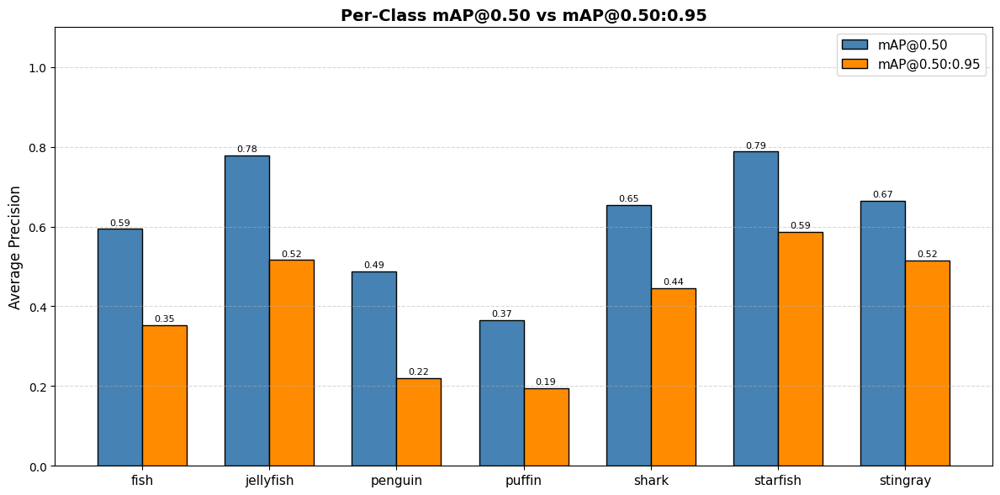

In [14]:
width = 0.35
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - width/2, per_class_map50,    width, label='mAP@0.50',      color='steelblue',  edgecolor='black')
ax.bar(x + width/2, per_class_map50_95, width, label='mAP@0.50:0.95', color='darkorange', edgecolor='black')
for i, (v1, v2) in enumerate(zip(per_class_map50, per_class_map50_95)):
    ax.text(i - width/2, v1 + 0.01, f'{v1:.2f}', ha='center', fontsize=8)
    ax.text(i + width/2, v2 + 0.01, f'{v2:.2f}', ha='center', fontsize=8)
ax.set_xticks(x)
ax.set_xticklabels(class_names, fontsize=11)
ax.set_ylabel('Average Precision', fontsize=12)
ax.set_ylim(0, 1.1)
ax.set_title('Per-Class mAP@0.50 vs mAP@0.50:0.95', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'plot1_per_class_mAP.png'), dpi=150, bbox_inches='tight')
plt.show()

### Precision, Recall and F1 per Class

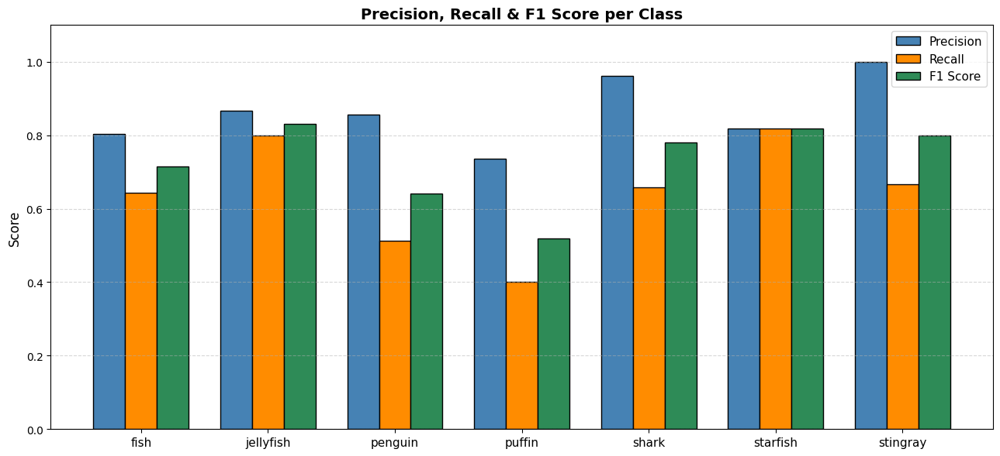

In [15]:
width = 0.25
fig, ax = plt.subplots(figsize=(13, 6))
ax.bar(x - width, per_class_precision, width, label='Precision', color='steelblue',  edgecolor='black')
ax.bar(x,         per_class_recall,    width, label='Recall',    color='darkorange', edgecolor='black')
ax.bar(x + width, per_class_f1,        width, label='F1 Score',  color='seagreen',   edgecolor='black')
ax.set_xticks(x)
ax.set_xticklabels(class_names, fontsize=11)
ax.set_ylabel('Score', fontsize=12)
ax.set_ylim(0, 1.1)
ax.set_title('Precision, Recall & F1 Score per Class', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'plot2_precision_recall_f1.png'), dpi=150, bbox_inches='tight')
plt.show()

### Overall Performance Summary

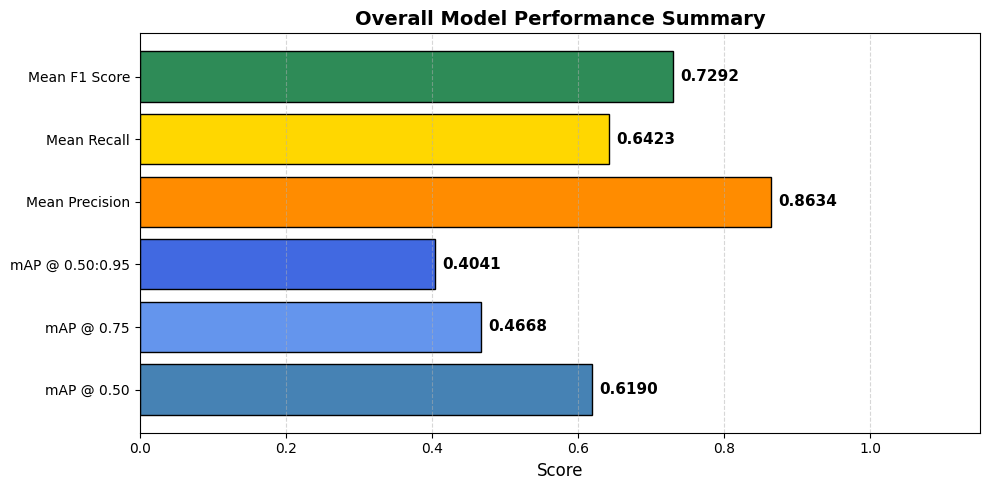

In [16]:
overall_metrics = {
    'mAP @ 0.50'     : overall_map50,
    'mAP @ 0.75'     : overall_map75,
    'mAP @ 0.50:0.95': overall_map50_95,
    'Mean Precision' : np.mean(per_class_precision),
    'Mean Recall'    : np.mean(per_class_recall),
    'Mean F1 Score'  : np.mean(per_class_f1),
}
colors = ['steelblue', 'cornflowerblue', 'royalblue', 'darkorange', 'gold', 'seagreen']
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.barh(list(overall_metrics.keys()), list(overall_metrics.values()), color=colors, edgecolor='black')
for bar, val in zip(bars, overall_metrics.values()):
    ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.4f}', va='center', fontsize=11, fontweight='bold')
ax.set_xlim(0, 1.15)
ax.set_xlabel('Score', fontsize=12)
ax.set_title('Overall Model Performance Summary', fontsize=14, fontweight='bold')
ax.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'plot3_overall_summary.png'), dpi=150, bbox_inches='tight')
plt.show()

### Per-Class Metrics Heatmap

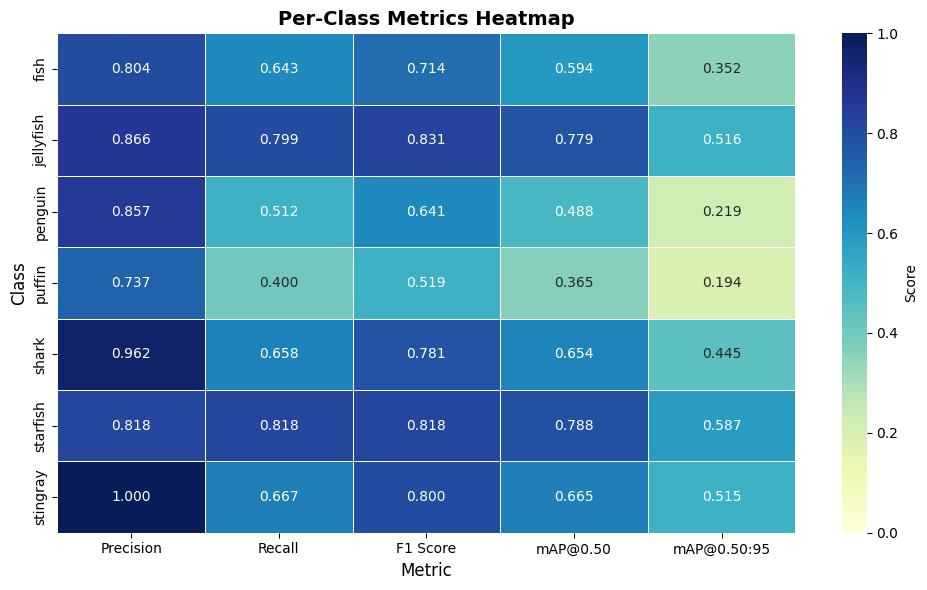

In [17]:
heatmap_data = pd.DataFrame({
    'Precision'  : per_class_precision,
    'Recall'     : per_class_recall,
    'F1 Score'   : per_class_f1,
    'mAP@0.50'   : per_class_map50,
    'mAP@0.50:95': per_class_map50_95,
}, index=class_names)

fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt='.3f', cmap='YlGnBu', linewidths=0.5,
            ax=ax, vmin=0, vmax=1, cbar_kws={'label': 'Score'})
ax.set_title('Per-Class Metrics Heatmap', fontsize=14, fontweight='bold')
ax.set_xlabel('Metric', fontsize=12)
ax.set_ylabel('Class', fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'plot4_metrics_heatmap.png'), dpi=150, bbox_inches='tight')
plt.show()

### Per-Class F1 Score — Radar Chart

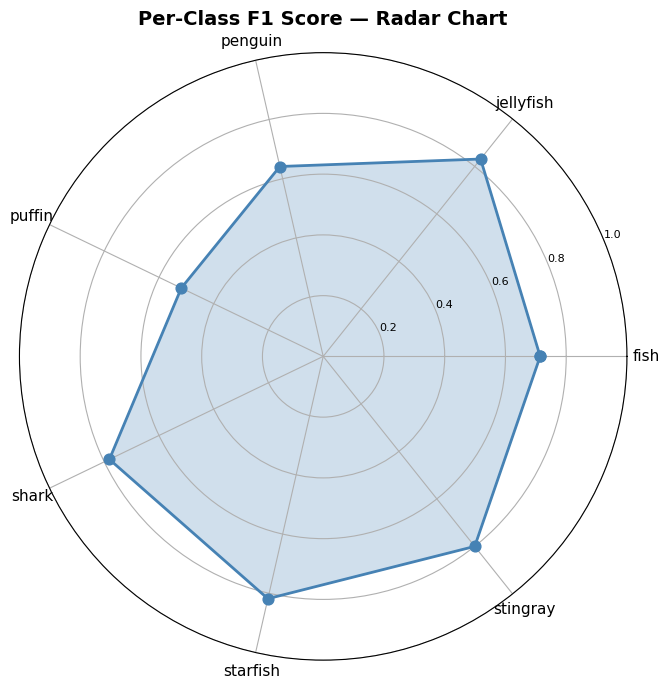

In [18]:
angles = np.linspace(0, 2 * np.pi, len(class_names), endpoint=False).tolist()
values = per_class_f1 + per_class_f1[:1]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='steelblue', alpha=0.25)
ax.plot(angles, values, color='steelblue', linewidth=2)
ax.scatter(angles, values, color='steelblue', s=60, zorder=5)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(class_names, fontsize=11)
ax.set_ylim(0, 1)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize=8)
ax.set_title('Per-Class F1 Score — Radar Chart', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig(os.path.join(plots_dst, 'plot5_radar_f1.png'), dpi=150, bbox_inches='tight')
plt.show()

## Hyperparameter Tuning
Searching for better hyperparameters with the Ultralytics genetic-evolution tuner. The Ray Tune version failed earlier because Ray started the trials on CPU without GPU access; the built-in tuner runs directly on the GPU and is more reliable on Kaggle.

This takes a while (10 iterations × 30 epochs). Set `RUN_TUNING = False` to skip it.

In [19]:
RUN_TUNING = True

if RUN_TUNING:
    tune_model = YOLO('yolov8n.pt')
    tune_model.tune(
        data=yaml_path,
        epochs=30,
        iterations=10,
        imgsz=640,
        batch=16,
        optimizer='AdamW',
        device=device,
        plots=False,
        save=False,
        val=True,
        project=project_dir,
        name='tune',
        exist_ok=True,
    )

    best_hyp = glob.glob(os.path.join(project_dir, 'tune*', 'best_hyperparameters.yaml'))
    if best_hyp:
        print('Best Hyperparameters Found:\n')
        print(open(best_hyp[0]).read())
        shutil.copy(best_hyp[0], export_dir)

Tuner: Initialized Tuner instance with 'tune_dir=/kaggle/working/runs/tune'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/10 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'cls_pw': 0.0, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'cutmix': 0.0, 'copy_paste': 0.0, 'close_mosaic': 10}

MultiTrainer 1/1: fine-tuning on /kaggle/working/data.yml
Ultralytics 8.4.155 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.55G      2.115      2.795      1.687        316        640: 100% ━━━━━━━━━━━━ 28/28 8.6it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.2it/s 1.8s0.7s
                   all        127        909   0.000603     0.0269   5.39e-05   1.82e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.55G      2.143      2.725      1.726        227        640: 100% ━━━━━━━━━━━━ 28/28 8.7it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.2s1.6ss
                   all        127        909   2.74e-05    0.00645   2.74e-06   4.61e-07

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.55G      2.115      2.623      1.672        160        640: 100% ━━━━━━━━━━━━ 28/28 8.8it/s 3.2s0.1s
                 Class     Images  Instances 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.58G     0.9875      2.761      4.382        296        640: 100% ━━━━━━━━━━━━ 28/28 8.0it/s 3.5s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0it/s 4.0s1.5ss
                   all        127        909   0.000207    0.00248   8.18e-06   2.58e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.58G     0.9856      2.723       4.47        213        640: 100% ━━━━━━━━━━━━ 28/28 7.6it/s 3.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.1it/s 1.9s0.7s
                   all        127        909    0.00283     0.0464   0.000286   5.55e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.58G     0.9862      2.594      4.416        152        640: 100% ━━━━━━━━━━━━ 28/28 8.2it/s 3.4s0.2s
                 Class     Images  Instances 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30       2.6G      1.966       3.06      1.808        204        640: 100% ━━━━━━━━━━━━ 28/28 7.7it/s 3.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8s/it 7.2s2.8ss
                   all        127        909   4.82e-05   0.000622   6.38e-07   6.38e-08

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30       2.6G      2.012      2.977      1.851        226        640: 100% ━━━━━━━━━━━━ 28/28 7.4it/s 3.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3s/it 5.3s2.0ss
                   all        127        909          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30       2.6G      1.953      2.814      1.788        200        640: 100% ━━━━━━━━━━━━ 28/28 7.7it/s 3.6s0.1s
                 Class     Images  Instances

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30       2.6G      2.007      2.963      1.709        258        640: 100% ━━━━━━━━━━━━ 28/28 8.9it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.2s1.6ss
                   all        127        909    3.6e-05   0.000311   2.27e-07   4.53e-08

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30       2.6G      1.984      2.895      1.736        204        640: 100% ━━━━━━━━━━━━ 28/28 8.1it/s 3.5s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.2s1.6ss
                   all        127        909   0.000291     0.0127   2.15e-05   3.31e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30       2.6G      1.935      2.703       1.68        155        640: 100% ━━━━━━━━━━━━ 28/28 8.5it/s 3.3s0.1s
                 Class     Images  Instances

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.55G      2.111      2.853      1.714        311        640: 100% ━━━━━━━━━━━━ 28/28 8.7it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3s/it 5.2s2.0ss
                   all        127        909    0.00152     0.0621   0.000278   7.64e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.55G      2.141      2.823      1.753        243        640: 100% ━━━━━━━━━━━━ 28/28 8.4it/s 3.3s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.6it/s 1.5s0.6s
                   all        127        909     0.0012     0.0809   0.000181   3.43e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.55G      2.139      2.746      1.733        166        640: 100% ━━━━━━━━━━━━ 28/28 8.6it/s 3.3s0.1s
                 Class     Images  Instances 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.61G     0.8127      4.453      1.679        347        640: 100% ━━━━━━━━━━━━ 28/28 8.8it/s 3.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.4s1.7ss
                   all        127        909   1.58e-05    0.00184   2.39e-07   7.57e-08

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.61G     0.8622      4.427      1.775        239        640: 100% ━━━━━━━━━━━━ 28/28 8.3it/s 3.4s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.7s1.4s
                   all        127        909          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.61G     0.8245      4.127      1.711        165        640: 100% ━━━━━━━━━━━━ 28/28 8.3it/s 3.4s0.2s
                 Class     Images  Instances 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.51G      3.501      1.061     0.4963        294        640: 100% ━━━━━━━━━━━━ 28/28 6.9it/s 4.1s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7s/it 6.8s2.6ss
                   all        127        909          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.51G      3.569      1.054     0.5227        209        640: 100% ━━━━━━━━━━━━ 28/28 6.9it/s 4.1s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7s/it 7.0s2.7ss
                   all        127        909   0.000396    0.00431      4e-06   1.16e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.51G      3.508      1.048     0.5219        154        640: 100% ━━━━━━━━━━━━ 28/28 6.8it/s 4.1s0.2s
                 Class     Images  Instances

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.52G      2.561      2.966      1.845        225        640: 100% ━━━━━━━━━━━━ 28/28 7.5it/s 3.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.5it/s 2.6s0.9s
                   all        127        909   0.000253     0.0176   1.69e-05    4.1e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.52G      2.654      2.858      1.879        268        640: 100% ━━━━━━━━━━━━ 28/28 7.4it/s 3.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7s/it 6.8s2.6ss
                   all        127        909   0.000134    0.00521   1.69e-06    4.1e-07

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.52G      2.645      2.725       1.85        240        640: 100% ━━━━━━━━━━━━ 28/28 7.2it/s 3.9s0.2s
                 Class     Images  Instances 

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30      2.63G      2.691      2.916      1.816        192        640: 100% ━━━━━━━━━━━━ 28/28 7.6it/s 3.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.6s1.8ss
                   all        127        909   4.23e-06   0.000922   2.97e-08   2.97e-09

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30      2.63G      2.772      3.005      1.849        129        640: 100% ━━━━━━━━━━━━ 28/28 7.5it/s 3.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.5s1.7ss
                   all        127        909   3.16e-05    0.00737   5.03e-06   1.52e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30      2.63G      2.704      2.881      1.846        243        640: 100% ━━━━━━━━━━━━ 28/28 7.8it/s 3.6s0.1s
                 Class     Images  Instances

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/30       2.6G      2.776      2.972      2.563        149        640: 100% ━━━━━━━━━━━━ 28/28 7.8it/s 3.6s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.6s/it 6.3s2.4ss
                   all        127        909          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/30       2.6G      2.823      3.056      2.608         99        640: 100% ━━━━━━━━━━━━ 28/28 7.4it/s 3.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.2it/s 1.8s0.7s
                   all        127        909          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/30       2.6G      2.734      2.897      2.552        173        640: 100% ━━━━━━━━━━━━ 28/28 7.9it/s 3.6s0.1s
                 Class     Images  Instances 

## Exporting Portfolio Files
Collecting weights, metrics, plots and sample predictions into `CV_Portfolio_YOLO.zip`. Download it from the link below or from the **Output** tab on the right.

In [20]:
weights_dst = os.path.join(export_dir, 'weights')
os.makedirs(weights_dst, exist_ok=True)
shutil.copy(os.path.join(run_dir, 'weights/best.pt'), weights_dst)
shutil.copy(os.path.join(run_dir, 'weights/last.pt'), weights_dst)
shutil.copy(os.path.join(run_dir, 'results.csv'), export_dir)
shutil.copy(yaml_path, export_dir)

for fname in os.listdir(run_dir):
    if fname.endswith(('.png', '.jpg')):
        shutil.copy(os.path.join(run_dir, fname), plots_dst)

for root, dirs, fnames in os.walk(export_dir):
    level = root.replace(export_dir, '').count(os.sep)
    print(f"{'    ' * level}│ {os.path.basename(root)}/")
    for fname in fnames:
        size = os.path.getsize(os.path.join(root, fname)) / 1024
        print(f"{'    ' * (level + 1)}│ {fname}  ({size:.1f} KB)")

os.chdir(work_dir)
shutil.make_archive('CV_Portfolio_YOLO', 'zip', work_dir, 'CV_Portfolio_YOLO')
FileLink('CV_Portfolio_YOLO.zip')

│ CV_Portfolio_YOLO/
    │ best_hyperparameters.yaml  (0.8 KB)
    │ data.yml  (0.2 KB)
    │ results.csv  (12.0 KB)
    │ inference_samples/
        │ pred_IMG_2630_jpeg_jpg.rf.310f0c986a72be46b80ce31c2d00e46d.jpg  (320.2 KB)
        │ pred_IMG_8582_MOV-5_jpg.rf.9d7a26fbf145ce39ab0831b4e6bc1f1e.jpg  (116.2 KB)
        │ pred_IMG_3154_jpeg_jpg.rf.5f429a366c02d38bc9e2217f4508c3e0.jpg  (253.3 KB)
        │ pred_IMG_2470_jpeg_jpg.rf.75b359c8baa6866bfecf07a0e4e8c33d.jpg  (251.7 KB)
        │ pred_IMG_2379_jpeg_jpg.rf.7dc3160c937072d26d4624c6c48e904d.jpg  (152.8 KB)
        │ pred_IMG_8497_MOV-0_jpg.rf.5c59bd1bf7d8fd7a20999d51a79a12c0.jpg  (220.6 KB)
        │ pred_IMG_2448_jpeg_jpg.rf.28ce79dab47ad525751d5407be09bc3d.jpg  (174.8 KB)
        │ pred_IMG_2466_jpeg_jpg.rf.53886abb9947ec4e47405957b30fe314.jpg  (95.4 KB)
        │ pred_IMG_8420_jpg.rf.31f1d5f1440e48ccf1dee988b565911b.jpg  (335.2 KB)
        │ pred_IMG_8595_MOV-0_jpg.rf.312ab0b8b9fca18134aee88044f45a06.jpg  (241.8 KB)
        │ p

/kaggle/working/CV_Portfolio_YOLO.zip